In [1]:
%config InlineBackend.figure_formats = ["retina"]

In [107]:
!pip install -q folium scikit-learn census seaborn geopandas

# Incarceration, Arrests, and Poverty

In [108]:
import census
import folium
import folium.plugins
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from census import Census
from shapely import Point
from sklearn.linear_model import HuberRegressor

## Incarceration and poverty

In [3]:
census = Census("", year=2020)

In [4]:
total_pop_col = "B06012_001E"
below_poverty_level_pop_col = "B06012_002E"

In [5]:
year = 2017

In [6]:
acs_poverty_df = pd.DataFrame(
    census.acs5.get(
        (total_pop_col, below_poverty_level_pop_col),
        geo={
            "for": "county:*",
            "in": f"state:*",
        },
        year=year,
    )
)

In [7]:
acs_poverty_df["GEOID"] = acs_poverty_df["state"] + acs_poverty_df["county"]
acs_poverty_df = acs_poverty_df.set_index("GEOID").drop(columns=["state", "county"]).rename(
    columns={
        total_pop_col: "total_pop",
        below_poverty_level_pop_col: "below_poverty_level_pop",
    }
)
acs_poverty_df["poverty_rate"] = 100 * acs_poverty_df["below_poverty_level_pop"] / acs_poverty_df["total_pop"] 

In [8]:
acs_poverty_df

,total_pop,below_poverty_level_pop,poverty_rate
GEOID,,,
40045,4057.0,696.0,17.155534
40051,53520.0,6645.0,12.415919
40119,72614.0,19108.0,26.314485
40125,68244.0,11581.0,16.969990
40037,69747.0,10589.0,15.182015
...,...,...,...
40123,36806.0,6351.0,17.255339
40129,3684.0,677.0,18.376764
40153,20114.0,2348.0,11.673461


In [9]:
incarc_all_years_df = pd.read_csv("https://raw.githubusercontent.com/vera-institute/incarceration-trends/refs/heads/main/incarceration_trends.csv")

In [10]:
incarc_df = incarc_all_years_df[incarc_all_years_df["year"] == year].set_index("fips")
incarc_df.index = incarc_df.index.astype(str).str.zfill(5)

In [11]:
pd.set_option("display.max_columns", None)

incarc_df

,yfips,year,state,county_name,total_pop,total_pop_15to64,female_pop_15to64,male_pop_15to64,aapi_pop_15to64,black_pop_15to64,latinx_pop_15to64,native_pop_15to64,white_pop_15to64,urbanicity,region,division,commuting_zone,metro_area,land_area,total_jail_pop,female_jail_pop,male_jail_pop,female_adult_jail_pop,female_juvenile_jail_pop,male_adult_jail_pop,male_juvenile_jail_pop,aapi_jail_pop,black_jail_pop,latinx_jail_pop,native_jail_pop,white_jail_pop,other_race_jail_pop,total_jail_pretrial,total_jail_from_prison,total_jail_from_other_jail,total_jail_from_fed,total_jail_from_bia,total_jail_from_bop,total_jail_from_ice,total_jail_from_marshals,total_jail_from_other_fed,jail_rated_capacity,private_jail_flag,regional_jail_flag,total_jail_adm,total_jail_dis,total_jail_pop_dcrp,female_jail_pop_dcrp,male_jail_pop_dcrp,total_jail_adm_dcrp,female_jail_adm_dcrp,male_jail_adm_dcrp,total_prison_pop,female_prison_pop,male_prison_pop,aapi_prison_pop,black_prison_pop,latinx_prison_pop,native_prison_pop,other_race_prison_pop,white_prison_pop,aapi_female_prison_pop,aapi_male_prison_pop,black_female_prison_pop,black_male_prison_pop,latinx_female_prison_pop,latinx_male_prison_pop,native_female_prison_pop,native_male_prison_pop,other_race_female_prison_pop,other_race_male_prison_pop,white_female_prison_pop,white_male_prison_pop,total_prison_adm,female_prison_adm,male_prison_adm,aapi_prison_adm,black_prison_adm,latinx_prison_adm,native_prison_adm,other_race_prison_adm,white_prison_adm,aapi_female_prison_adm,aapi_male_prison_adm,black_female_prison_adm,black_male_prison_adm,latinx_female_prison_adm,latinx_male_prison_adm,native_female_prison_adm,native_male_prison_adm,other_race_female_prison_adm,other_race_male_prison_adm,white_female_prison_adm,white_male_prison_adm,total_jail_pop_rate,female_jail_pop_rate,male_jail_pop_rate,aapi_jail_pop_rate,black_jail_pop_rate,latinx_jail_pop_rate,native_jail_pop_rate,white_jail_pop_rate,total_jail_adm_rate,total_jail_pretrial_rate,total_prison_pop_rate,female_prison_pop_rate,male_prison_pop_rate,aapi_prison_pop_rate,black_prison_pop_rate,latinx_prison_pop_rate,native_prison_pop_rate,white_prison_pop_rate,total_prison_adm_rate,female_prison_adm_rate,male_prison_adm_rate,aapi_prison_adm_rate,black_prison_adm_rate,latinx_prison_adm_rate,native_prison_adm_rate,white_prison_adm_rate
fips,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
01001,201701001,2017,AL,Autauga County,55443,36352,18500,17852,585.0,7440.0,1023.0,149.0,27155.0,small/mid,South,East South Central,60.0,33860.0,594.45,165.0,25.0,127.0,25.0,0.0,127.0,0.0,0.00,48.00,2.00,0.83,76.0,0.0,97.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,136.0,0.0,0.0,780.0,1040.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,453.90,135.14,711.40,0.00,645.16,195.50,557.05,279.87,2145.69,266.84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01003,201701003,2017,AL,Baldwin County,212619,132067,67930,64137,1955.0,13108.0,6025.0,1060.0,109919.0,small/mid,South,East South Central,254.0,19300.0,1589.82,629.0,109.0,511.0,109.0,0.0,511.0,0.0,9.00,166.00,37.64,2.34,406.0,0.0,487.0,455.85,3.6,83.0,0.0,10.0,6.0,67.0,0.0,856.0,0.0,0.0,14990.0,14856.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,476.27,160.46,796.73,460.36,1266.40,624.73,220.75,369.36,11350.30,368.75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01005,201701005,2017,AL,Barbour County,25158,16086,7068,9018,97.0,8127.0,667.0,66.0,7129.0,rural,South,East South Central,20.0,NaN,885.00,111.0,8.0,92.0,8.0,0.0,92.0,0.0,0.00,10.00,8.00,3.66,82.0,0.0,42.0,74.00,0.0,2.0,0.0,0.0,1.0,1.0,0.0,129.0,0.0,0.0,780.0,260.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

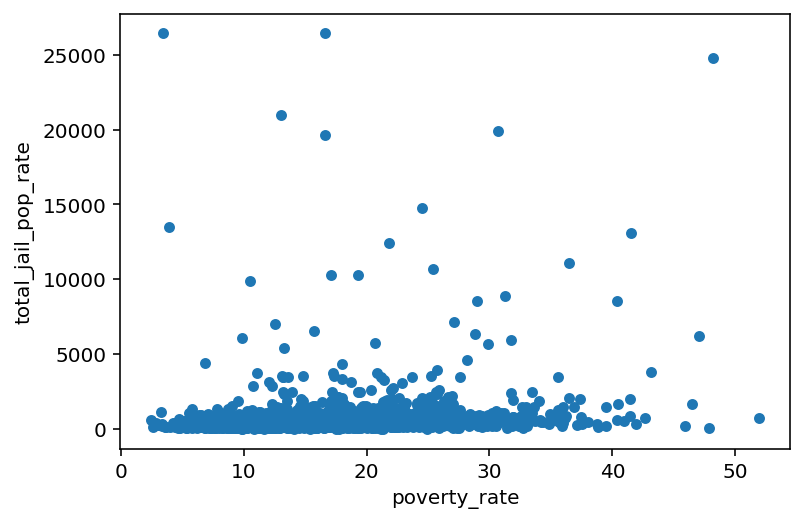

In [12]:
rates_df = incarc_df[["total_jail_pop_rate"]].join(acs_poverty_df[["total_pop", "poverty_rate"]])
rates_df.plot.scatter(x="poverty_rate", y="total_jail_pop_rate")
plt.show()

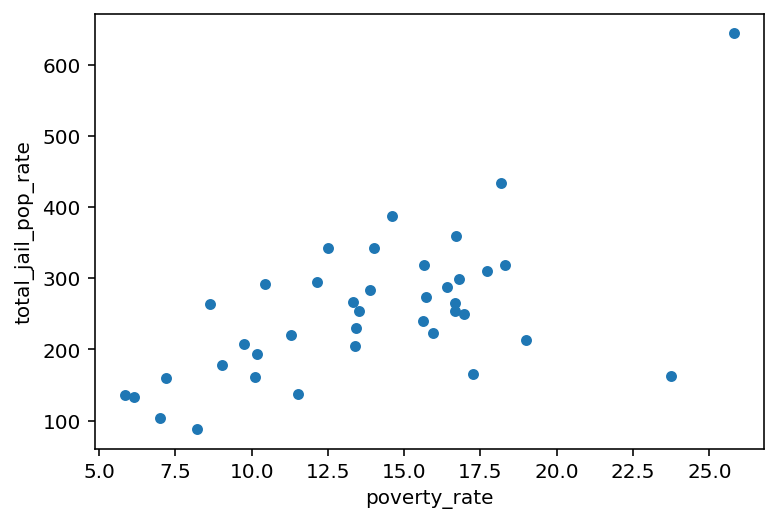

In [13]:
rates_df[rates_df["total_pop"] > 1000000].plot.scatter(x="poverty_rate", y="total_jail_pop_rate")
plt.show()

In [14]:
rates_df

,total_jail_pop_rate,total_pop,poverty_rate
fips,,,
01001,453.90,54558.0,13.715679
01003,476.27,200313.0,11.845462
01005,690.04,23283.0,27.195808
01007,502.71,20555.0,15.242034
01009,367.77,57051.0,15.633381
...,...,...,...
56037,460.35,43914.0,12.009837
56039,154.17,22825.0,6.838992
56041,337.04,20523.0,14.851630


In [15]:
state_rates_df = rates_df[rates_df.index.str.startswith("36")]

In [16]:
xs = np.linspace(state_rates_df["poverty_rate"].min(), state_rates_df["poverty_rate"].max())

In [17]:
model = HuberRegressor().fit(
    X=state_rates_df["poverty_rate"].to_numpy().reshape(-1, 1),
    y=state_rates_df["total_jail_pop_rate"],
    sample_weight=state_rates_df["total_pop"],
)
slope = model.coef_[0]
intercept = model.intercept_

/var/folders/wr/pcqhnvhd7cn8ssjr1v95ffrr0000gn/T/ipykernel_73886/601119352.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  g = sns.relplot(


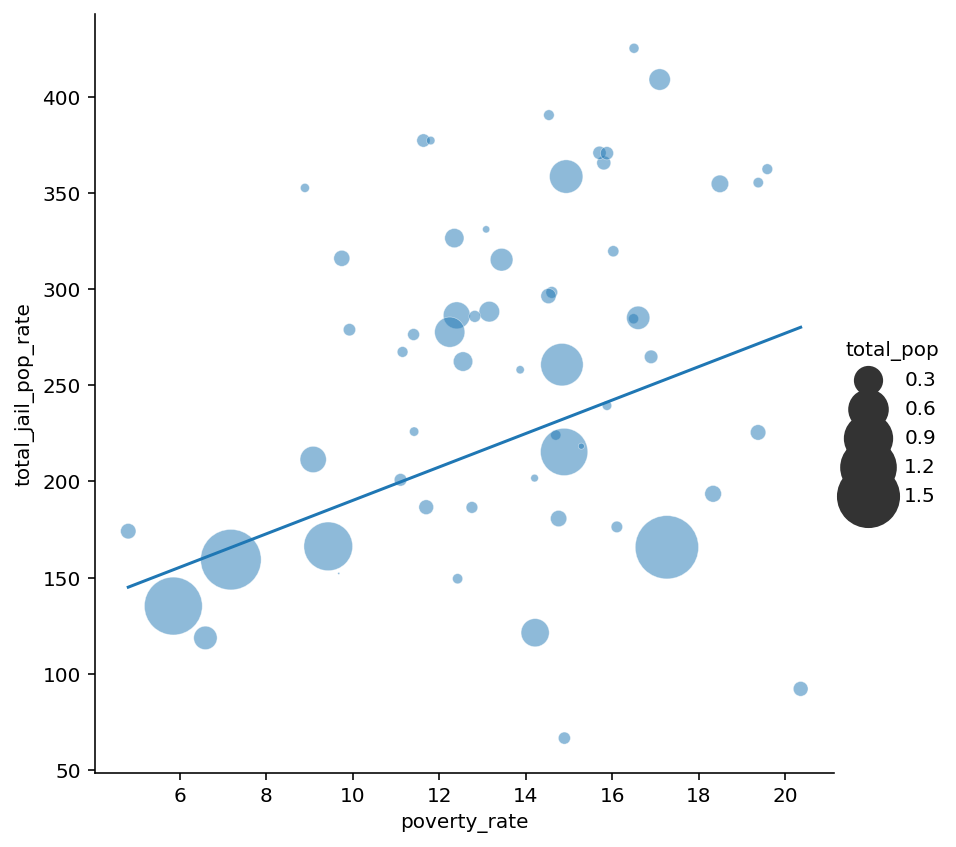

In [18]:
g = sns.relplot(
    x="poverty_rate",
    y="total_jail_pop_rate",
    size="total_pop",
    sizes=(1, 1000),
    alpha=.5,
    palette="muted",
    height=6,
    data=state_rates_df,
)
#g.set(ylim=(0, 1000))
plt.plot(xs, (slope * xs) + intercept)
plt.show()

/var/folders/wr/pcqhnvhd7cn8ssjr1v95ffrr0000gn/T/ipykernel_73886/1364369944.py:1: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  g = sns.relplot(


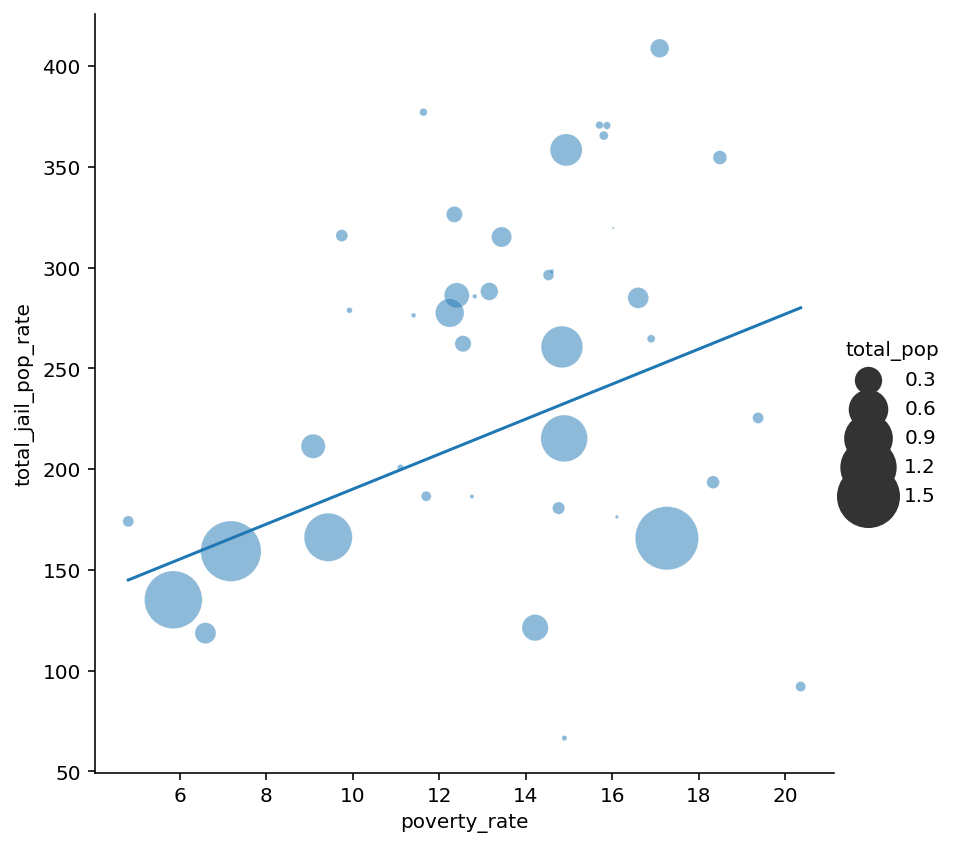

In [19]:
g = sns.relplot(
    x="poverty_rate",
    y="total_jail_pop_rate",
    size="total_pop",
    sizes=(1, 1000),
    alpha=.5,
    palette="muted",
    height=6,
    data=state_rates_df[state_rates_df["total_pop"] > 50000],
)
#g.set(ylim=(0, 1000))
plt.plot(xs, (slope * xs) + intercept)
plt.show()

In [20]:
incarc_df.iloc[incarc_df["total_jail_pop_rate"].argmax()][["total_pop", "total_jail_pop", "total_jail_pop_rate"]]

total_pop                  2207
total_jail_pop           367.95
total_jail_pop_rate    26433.19
Name: 48125, dtype: object

In [ ]:
pd.DataFrame({
    'computed_rate': (100000 * incarc_df["total_jail_pop"] / incarc_df["total_pop_15to64"]),
    'total_jail_pop_rate': incarc_df["total_jail_pop_rate"]
}).plot.scatter(x='computed_rate', y='total_jail_pop_rate')
plt.show()

## A tale of two cities

### Arrests in San Francisco

Original dataset (DataSF): [Police Department Incident Reports: 2018 to Present](https://data.sfgov.org/Public-Safety/Police-Department-Incident-Reports-2018-to-Present/wg3w-h783/about_data)

In [49]:
sf_incidents_df = pd.read_csv("Police_Department_Incident_Reports__2018_to_Present_20250315.csv")

In [50]:
sf_incidents_df

,Incident Datetime,Incident Date,Incident Time,Incident Year,Incident Day of Week,Report Datetime,Row ID,Incident ID,Incident Number,CAD Number,...,Longitude,Point,Neighborhoods,ESNCAG - Boundary File,Central Market/Tenderloin Boundary Polygon - Updated,Civic Center Harm Reduction Project Boundary,HSOC Zones as of 2018-06-05,Invest In Neighborhoods (IIN) Areas,Current Supervisor Districts,Current Police Districts
0,2023/03/01 05:02:00 AM,2023/03/01,05:02,2023,Wednesday,2023/03/11 03:40:00 PM,125379506374,1253795,236046151,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023/03/13 10:59:00 AM,2023/03/13,10:59,2023,Monday,2023/03/13 11:00:00 AM,125355107041,1253551,230174885,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2023/03/14 06:44:00 PM,2023/03/14,18:44,2023,Tuesday,2023/03/14 06:45:00 PM,125402407041,1254024,230176728,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2023/02/15 03:00:00 AM,2023/02/15,03:00,2023,Wednesday,2023/03/11 04:55:00 PM,125378606372,1253786,236046123,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2023/03/13 11:26:00 AM,2023/03/13,11:26,2023,Monday,2023/03/13 01:37:00 PM,125419506244,1254195,236046850,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940027,2025/03/14 09:07:00 AM,2025/03/14,09:07,2025,Friday,2025/03/14 09:07:00 AM,146873016710,1468730,250145731,250730762.0,...,-122.406479,POINT (-122.40647888183594 37.78273010253906),32.0,NaN,1.0,1.0,NaN,NaN,10.0,1.0
940028,2025/03/14 06:15:00 PM,2025/03/14,18:15,2025,Friday,2025/03/14 06:44:00 PM,146886406304,1468864,250147000,250732465.0,...,-122.464424,POINT (-122.46442413330078 37.78293991088867),5.0,NaN,NaN,NaN,NaN,NaN,4.0,8.0
940029,2025/03/14 08:15:00 PM,2025/03/14,20:15,2025,Friday,2025/03/14 08:15:00 PM,146887204013,1468872,250147088,250732710.0,...,-122.443504,POINT (-122.4435043334961 37.7780876159668),97.0,NaN,NaN,NaN,NaN,NaN,11.0,7.0
940030,2025/02/19 12:00:00 PM,2025/02/19,12:00,2025,Wednesday,2025/03/14 06:42:00 PM,146888871013,1468888,250146983,250732293.0,...,-122.423401,POINT (-122.42340087890625 37.78733825683594),100.0,NaN,NaN,NaN,NaN,NaN,6.0,4.0


In [51]:
sf_incidents_df["Resolution"].value_counts()

Resolution
Open or Active          750695
Cite or Arrest Adult    182062
Unfounded                 4608
Exceptional Adult         2667
Name: count, dtype: int64

In [52]:
sf_incidents_df["CNN"].value_counts()

CNN
23914000.0    4661
34016000.0    4505
24929000.0    4432
24904000.0    4334
30044000.0    3267
              ... 
50278000.0       1
54184000.0       1
54037000.0       1
23111000.0       1
51276000.0       1
Name: count, Length: 7048, dtype: int64

In [63]:
sf_arrests_df = sf_incidents_df[sf_incidents_df["Resolution"] == "Cite or Arrest Adult"][[
    "Incident ID",
    "Incident Datetime",
    "Report Datetime",
    "Incident Category",
    "Incident Subcategory", 
    "Incident Description",
    "Intersection", 
    "Police District",
    "Analysis Neighborhood", 
    "Supervisor District",
    "Latitude",
    "Longitude",
]].rename(columns={
    "Incident ID": "incident_id",
    "Incident Datetime": "incident_datetime",
    "Report Datetime": "report_datetime",
    "Incident Category": "incident_category",
    "Incident Subcategory": "incident_subcategory", 
    "Incident Description": "incident_description",
    "Intersection": "intersection", 
    "Police District": "police_district",
    "Analysis Neighborhood": "neighborhood", 
    "Supervisor District": "supervisor_district",
    "Latitude": "lat",
    "Longitude": "lon",
}).set_index("incident_id")

In [64]:
sf_arrests_df = sf_arrests_df[~pd.isna(sf_arrests_df["lat"]) & ~pd.isna(sf_arrests_df["lon"])].copy()

In [67]:
for dt_column in ("incident_datetime", "report_datetime"):
    sf_arrests_df[dt_column] = pd.to_datetime(
        sf_arrests_df[dt_column],
        format="%Y/%m/%d %I:%M:%S %p",
    )

In [66]:
sf_arrests_df

,incident_datetime,report_datetime,incident_category,incident_subcategory,incident_description,intersection,police_district,neighborhood,supervisor_district,lat,lon
incident_id,,,,,,,,,,,
1047858,2021-07-07 08:18:00,2021-07-07 08:28:00,Assault,Simple Assault,Battery,23RD ST \ MISSION ST,Mission,Mission,9.0,37.753837,-122.418594
1036934,2021-06-04 09:40:00,2021-06-04 09:42:00,Assault,Simple Assault,Battery,GEARY ST \ POLK ST,Northern,Tenderloin,5.0,37.785893,-122.419739
1148258,2022-05-07 21:02:00,2022-05-07 21:25:00,Assault,Simple Assault,Battery,MASON ST \ DERBY ST,Central,Tenderloin,3.0,37.787429,-122.409931
1075668,2021-09-30 09:00:00,2021-09-30 09:22:00,Assault,Simple Assault,Battery,16TH ST \ MISSION ST,Mission,Mission,9.0,37.765051,-122.419669
1103675,2021-12-18 00:45:00,2021-12-18 00:45:00,Other Miscellaneous,Other,Investigative Detention,POLK ST \ FERN ST,Northern,Nob Hill,3.0,37.788223,-122.420210
...,...,...,...,...,...,...,...,...,...,...,...
1468667,2025-03-13 19:12:00,2025-03-13 19:15:00,Drug Offense,Drug Violation,"Narcotics Paraphernalia, Possession of",EDDY ST \ LEAVENWORTH ST,Tenderloin,Tenderloin,5.0,37.783722,-122.414238
1468843,2025-03-14 13:35:00,2025-03-14 13:35:00,Other Miscellaneous,Loitering,Lodging Without Permission,19TH ST \ MISSION ST,Mission,Mission,9.0,37.760235,-122.419205
1468759,2025-03-14 11:03:00,2025-03-14 11:03:00,Larceny Theft,Larceny Theft - From Building,"Theft, From Building, >$950",BOARDMAN PL \ BRYANT ST,Southern,South of Market,6.0,37.775162,-122.403633


In [ ]:
sf_arrest

In [197]:
sf_counts_by_intersection_month = sf_arrests_df.groupby(
    # latitudes/longitudes correspond to street intersections
    [pd.Grouper(key="incident_datetime", freq="ME"), "lat", "lon"]
).count()["report_datetime"]
sf_counts_by_intersection_month

incident_datetime  lat        lon        
2018-01-31         37.708855  -122.405113    2
                   37.708999  -122.458241    1
                   37.709098  -122.405981    1
                   37.709540  -122.439631    2
                   37.709679  -122.453888    2
                                            ..
2025-03-31         37.801689  -122.414490    3
                   37.802826  -122.413033    3
                   37.806499  -122.436104    1
                   37.828342  -122.377098    1
                   37.829449  -122.376007    1
Name: report_datetime, Length: 65898, dtype: int64

In [159]:
sf_counts_by_intersection_month.sort_values().tail(20)

incident_datetime  lat        lon        
2023-04-30         37.779212  -122.410937     62
2019-07-31         37.786410  -122.408036     64
2025-02-28         37.780537  -122.408157     64
2019-01-31         37.786410  -122.408036     65
2024-03-31         37.782570  -122.430801     68
2023-06-30         37.779212  -122.410937     70
2024-11-30         37.781754  -122.409691     71
2024-02-29         37.782570  -122.430801     74
2023-05-31         37.779212  -122.410937     74
2024-04-30         37.782570  -122.430801     75
2023-07-31         37.779212  -122.410937     76
2020-06-30         37.781654  -122.415505     79
2025-02-28         37.780972  -122.408707     82
2024-12-31         37.781754  -122.409691     87
2022-08-31         37.779992  -122.413487    100
2025-01-31         37.781754  -122.409691    101
                   37.780972  -122.408707    101
2018-12-31         37.786410  -122.408036    102
2022-07-31         37.779992  -122.413487    111
2023-08-31         37.77999

In [156]:
def to_heatmap(counts_by_date, max_incidents=None, date_format="%B %Y"):
    if max_incidents is None:
        # Max-normalize: for the heatmap, weights should be between 0 and 1.
        max_incidents = counts_by_date.max()
        
    heatmap = []
    heatmap_time_index = []
    for date, date_df in counts_by_date.groupby(level=0):
        incident_matrix = date_df.droplevel(0).reset_index().values
        incident_matrix[:, 2] = np.minimum(incident_matrix[:, 2] / max_incidents, 1)
        heatmap.append(incident_matrix.tolist())
        heatmap_time_index.append(date.strftime(date_format))

    return heatmap, heatmap_time_index

In [163]:
sf_heatmap, sf_heatmap_time_index = to_heatmap(sf_counts_by_intersection_month, max_incidents=50)

In [164]:
sf_heatmap_time_index[:5]

['January 2018', 'February 2018', 'March 2018', 'April 2018', 'May 2018']

In [212]:
sf_map = folium.Map(location=(37.73, -122.4194), tiles="cartodb positron", zoom_start=12)
sf_arrests_heatmap = folium.plugins.HeatMapWithTime(
    sf_heatmap, 
    index=sf_heatmap_time_index, 
    auto_play=True,
    max_opacity=0.3,
)
sf_arrests_heatmap.add_to(sf_map)

sf_map

### Arrests in Chicago
(from [Chicago Data Portal](https://data.cityofchicago.org/Public-Safety/Arrests/dpt3-jri9/about_data))

In [190]:
chicago_arrests_df = pd.read_csv("data_archive/chicago/chicago_arrests.csv")

In [191]:
chicago_arrests_df.dtypes

ID                        int64
Case Number              object
Date                     object
Block                    object
IUCR                     object
Primary Type             object
Description              object
Location Description     object
Domestic                   bool
Beat                      int64
District                  int64
Ward                    float64
Community Area          float64
FBI Code                 object
Updated On               object
Latitude                float64
Longitude               float64
dtype: object

In [192]:
# Filter out a small handful of arrests outside of a ward or community area
# (largely at O'Hare Airport)
chicago_arrests_df = chicago_arrests_df[
    ~pd.isna(chicago_arrests_df["Community Area"]) & ~pd.isna(chicago_arrests_df["Ward"])
].copy()

chicago_arrests_df["Ward"] = chicago_arrests_df["Ward"].astype(int)
chicago_arrests_df["Community Area"] = chicago_arrests_df["Community Area"].astype(int)

for dt_column in ("Date", "Updated On"):
    chicago_arrests_df[dt_column] = pd.to_datetime(
        chicago_arrests_df[dt_column],
        format="%m/%d/%Y %I:%M:%S %p",
    )

In [193]:
chicago_arrests_df = chicago_arrests_df.rename(
    columns={
        "ID": "id",
        "Case Number": "case_number",
        "Date": "date",
        "Block": "block",
        "IUCR": "iucr",
        "Primary Type": "type",
        "Location Description": "location_type",
        "Domestic": "is_domestic",
        "Beat": "beat",
        "District": "district",
        "Ward": "ward",
        "Community Area": "community_area",
        "FBI Code": "fbi_code",
        "Updated On": "updated_on",
        "Latitude": "lat",
        "Longitude": "lon",
    }
).set_index("id")


In [194]:
chicago_arrests_df

,case_number,date,block,iucr,type,Description,location_type,is_domestic,beat,district,ward,community_area,fbi_code,updated_on,lat,lon
id,,,,,,,,,,,,,,,,
11552724,JC100006,2018-12-31 23:56:00,018XX S ALLPORT ST,0440,BATTERY,AGG: HANDS/FIST/FEET NO/MINOR INJURY,OTHER,False,1233,12,25,31,08B,2019-01-10 15:16:50,41.857068,-87.657625
11552570,JB574407,2018-12-31 23:44:00,047XX N RACINE AVE,1330,CRIMINAL TRESPASS,TO LAND,MOVIE HOUSE/THEATER,False,1913,19,46,3,26,2019-01-10 15:16:50,41.968463,-87.659670
11552603,JC100036,2018-12-31 23:43:00,071XX S VINCENNES AVE,143A,WEAPONS VIOLATION,UNLAWFUL POSS OF HANDGUN,GAS STATION,False,731,7,6,69,15,2019-01-10 15:16:50,41.764632,-87.628312
11552568,JC100004,2018-12-31 23:42:00,030XX N MARMORA AVE,2022,NARCOTICS,POSS: COCAINE,ALLEY,False,2514,25,30,19,18,2019-01-10 15:16:50,41.935640,-87.773689
11552739,JC100117,2018-12-31 23:40:00,088XX S COTTAGE GROVE AVE,1477,WEAPONS VIOLATION,RECKLESS FIREARM DISCHARGE,STREET,False,632,6,8,44,15,2019-01-10 15:16:50,41.733551,-87.604749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13324833,JH100001,2024-01-01 00:04:00,034XX W WALNUT ST,0496,BATTERY,AGGRAVATED DOMESTIC BATTERY - KNIFE / CUTTING ...,APARTMENT,True,1123,11,28,27,04B,2024-12-21 15:40:46,41.885448,-87.711803
13623355,JH459217,2024-01-01 00:00:00,054XX N KIMBALL AVE,1582,OFFENSE INVOLVING CHILDREN,CHILD PORNOGRAPHY,APARTMENT,True,1712,17,39,13,17,2025-01-20 15:40:22,41.980153,-87.713656
13431182,JH227698,2024-01-01 00:00:00,050XX S MICHIGAN AVE,0281,CRIMINAL SEXUAL ASSAULT,NON-AGGRAVATED,OTHER (SPECIFY),False,224,2,3,38,02,2025-03-04 15:40:37,41.803366,-87.622683


In [207]:
chicago_counts_by_loc_month = chicago_arrests_df.groupby(
    # latitudes/longitudes correspond to street intersections
    [pd.Grouper(key="date", freq="ME"), "lat", "lon"]
).count()["ward"]

In [214]:
chicago_heatmap, chicago_heatmap_time_index = to_heatmap(chicago_counts_by_loc_month, max_incidents=10)

In [217]:
chicago_map = folium.Map(location=(41.8407, -87.6794), tiles="cartodb positron", zoom_start=11)
chicago_arrests_heatmap = folium.plugins.HeatMapWithTime(
    chicago_heatmap, 
    index=chicago_heatmap_time_index, 
    auto_play=True,
    max_opacity=0.3,
)
chicago_arrests_heatmap.add_to(chicago_map)

chicago_map

## Tying it all together: arrests vs. incarceration
* ["The Arrest-Jail Admission Gap"](https://www.vera.org/news/the-arrest-jail-admission-gap-jail-admission-rates-surpass-arrest-rates-in-small-and-rural-counties) (Vera Project) 
* [Chicago's Million-Dollar Blocks](https://chicagosmilliondollarblocks.com/#drug) (Chicago Justice Project)